# Improved Sports Image Classification

This notebook uses Transfer Learning with MobileNetV2 instead of training CNN from scratch.

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.20.0


In [10]:
# Configuration
BATCH_SIZE = 32
DATA_DIR = 'data'
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
VALID_DIR = os.path.join(DATA_DIR, 'valid')
TEST_DIR = os.path.join(DATA_DIR, 'test')
IMG_SIZE = (224, 224)

# Check if directories exist
print(f"Train dir: {os.path.exists(TRAIN_DIR)}")
print(f"Valid dir: {os.path.exists(VALID_DIR)}")
print(f"Test dir: {os.path.exists(TEST_DIR)}")

Train dir: True
Valid dir: True
Test dir: True


In [11]:
# Load Datasets
print("Loading Training Data...")
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DIR,
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True
)

print("Loading Validation Data...")
val_ds = tf.keras.utils.image_dataset_from_directory(
    VALID_DIR,
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print("Loading Test Data...")
test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False
)

class_names = train_ds.class_names
print(f"Class names: {class_names[:5]} ... (total {len(class_names)})\n")
num_classes = len(class_names)

Loading Training Data...
Found 13492 files belonging to 100 classes.
Loading Validation Data...
Found 500 files belonging to 100 classes.
Loading Test Data...
Found 500 files belonging to 100 classes.
Class names: ['air hockey', 'ampute football', 'archery', 'arm wrestling', 'axe throwing'] ... (total 100)



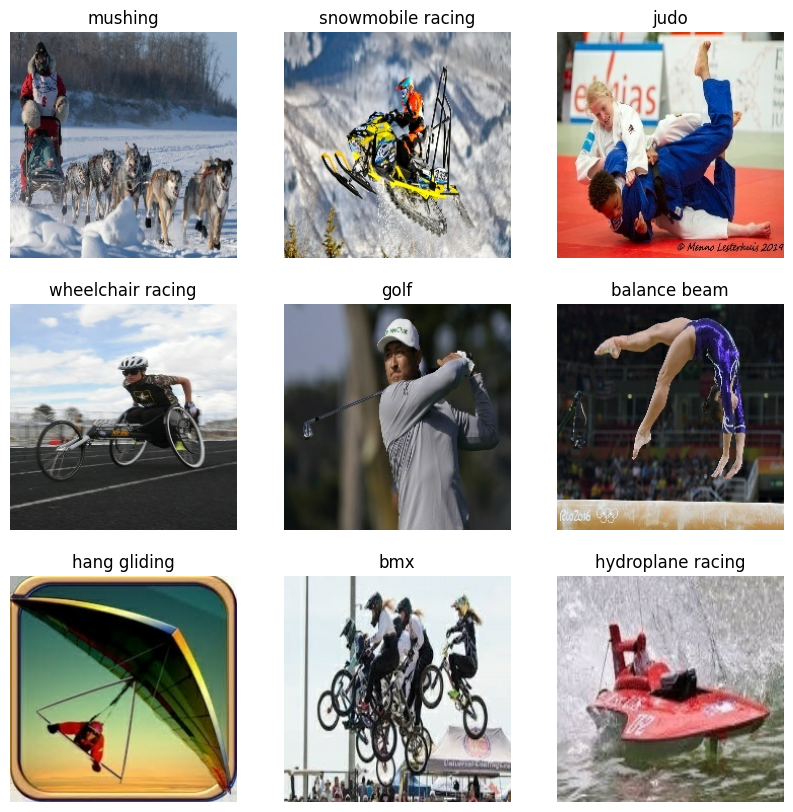

In [12]:
# Visualize some data
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [13]:
# Performance optimization
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [14]:
# Model Architecture: Transfer Learning with MobileNetV2
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

# Create the base model from the pre-trained model MobileNet V2
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

# Freeze the base model
base_model.trainable = False

global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')

inputs = tf.keras.Input(shape=IMG_SHAPE)
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)

model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │       128,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,386,084 (9.10 MB)

 Trainable params: 128,100 (500.39 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [15]:
# Compile
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.005),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
# Train
epochs = 10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=10
)

Epoch 1/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 69s 149ms/step - accuracy: 0.7144 - loss: 1.1884 - val_accuracy: 0.8620 - val_loss: 0.5367
Epoch 2/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 61s 144ms/step - accuracy: 0.8873 - loss: 0.4048 - val_accuracy: 0.8780 - val_loss: 0.4961
Epoch 3/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 60s 142ms/step - accuracy: 0.9174 - loss: 0.2789 - val_accuracy: 0.8700 - val_loss: 0.5193
Epoch 4/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 60s 141ms/step - accuracy: 0.9329 - loss: 0.2236 - val_accuracy: 0.8940 - val_loss: 0.5314
Epoch 5/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 63s 149ms/step - accuracy: 0.9377 - loss: 0.2155 - val_accuracy: 0.8780 - val_loss: 0.5533
Epoch 6/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 61s 145ms/step - accuracy: 0.9393 - loss: 0.2185 - val_accuracy: 0.8900 - val_loss: 0.5100
Epoch 7/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 60s 143ms/step - accuracy: 0.9506 - loss: 0.1990 - val_accuracy: 0.8980 - val_loss: 0.4998
Epoch 8/10
422/422 ━━━━━━━━━━━━━━━━━━━━ 60s 143ms/step - accuracy: 0.9542 - loss: 0

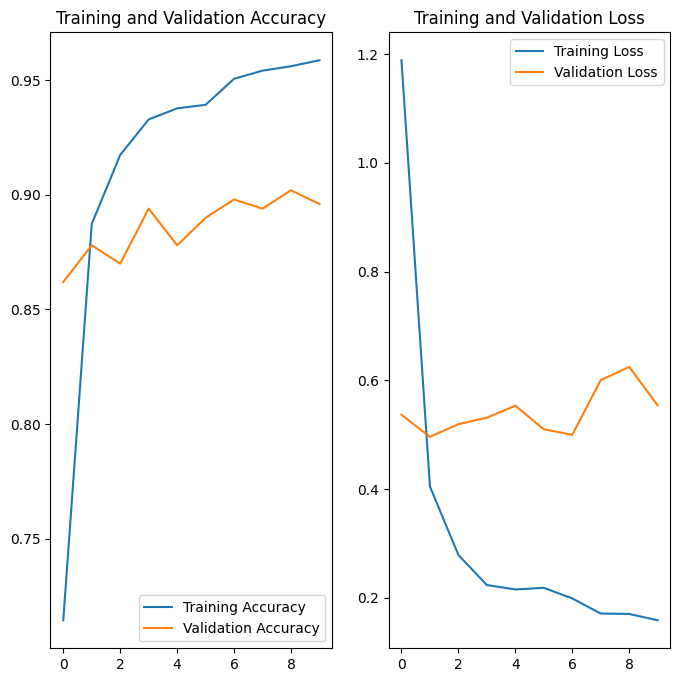

In [ ]:
# Plot results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [20]:
# Evaluate
print("Evaluating on test set...")
results = model.evaluate(test_ds)
print(f"Test Loss: {results[0]}")
print(f"Test Accuracy: {results[1]}")

Evaluating on test set...
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 135ms/step - accuracy: 0.9180 - loss: 0.5057
Test Loss: 0.5057335495948792
Test Accuracy: 0.9179999828338623


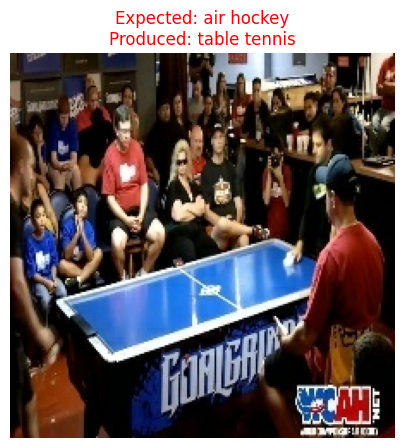

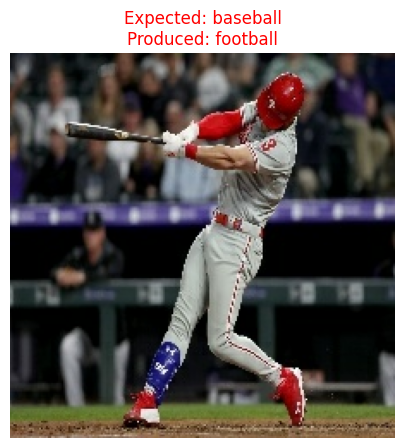

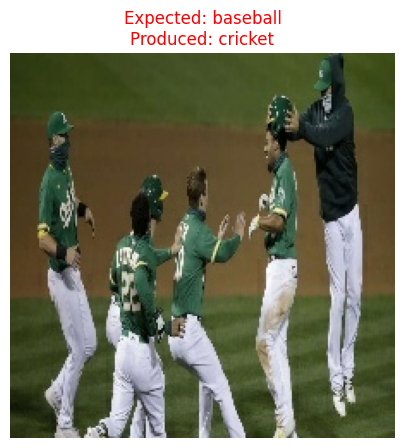

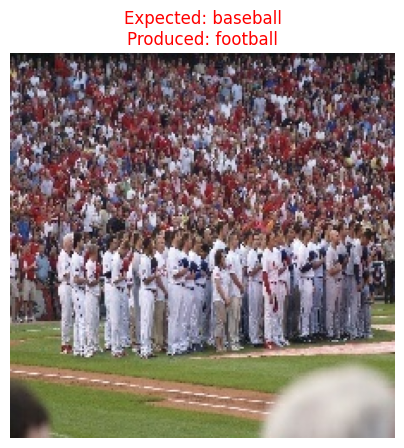

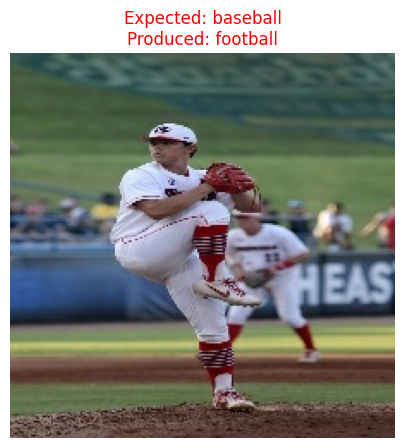

...

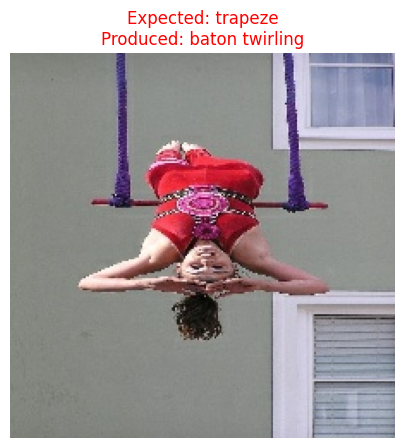

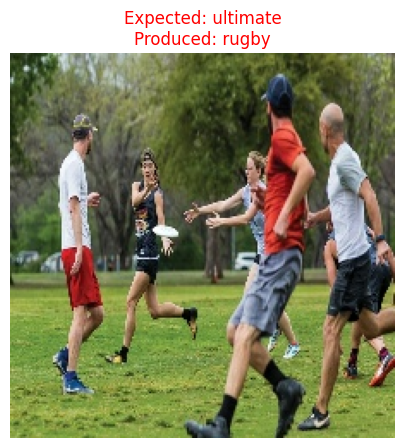

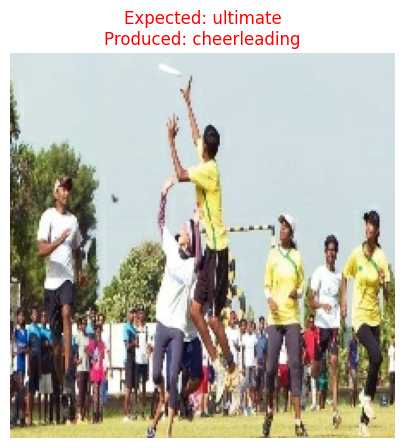

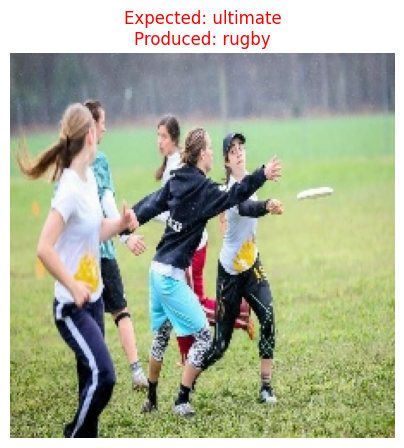

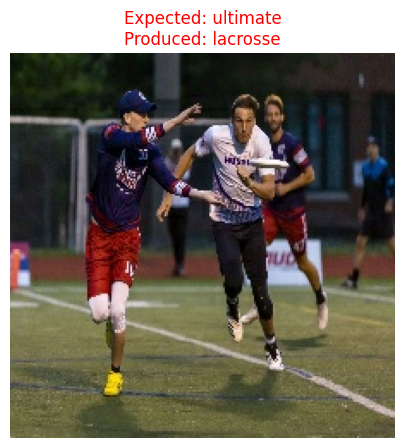

In [22]:
import numpy as np
import matplotlib.pyplot as plt

for images, labels in test_ds:
    predictions = model.predict(images, verbose=0)
    predicted_labels = np.argmax(predictions, axis=1)
    true_labels = labels.numpy()
    
    incorrect_indices = np.where(predicted_labels != true_labels)[0]
    
    for i in incorrect_indices:
        plt.figure(figsize=(5, 5))
        plt.imshow(images[i].numpy().astype("uint8"))
        
        true_name = class_names[true_labels[i]]
        pred_name = class_names[predicted_labels[i]]
        plt.title(f"Expected: {true_name}\nProduced: {pred_name}", color='red')
        plt.axis("off")
        plt.show()